# Introduction
To sort the documents, we will be using a technique called Non-Negative Matrix Factorization (NMF).  NMF uses a term frequency/inverse document frequency (TF/IDF) matrix to discover *latent topics* within a corpus.  The number of latent topics to extract must be determined by the user.  I have created a couple of tools that will assist in this process

What this process actually looks like is using a corpus to "train" a model to recognize a specified number of topics.  Once we have a trained model, it can be used to categorize new documents or corpora in the future.

#### About TF/IDF
A TF/IDF vector is generated for each document in the corpus.  TF/IDF is a technique used to weight the keywords of a document with relation to the corpus.  Each term is weighted inversely to its frequency within the corpus, meaning words that appear in a large number of documents (like 'contract') are not considered to be significant while words that appear in a small number of documents (like 'HVAC') are considered to be highly significant.

#### About NMF
NMF uses an algorithm based in linear algebra to group these TF/IDF vectors based on the collection of weights in each document.  The result is a matrix that relates each keyword to its relevancy in each topic that can be used to find the latent topics of any document in the corpus or any new documents it has never seen before.

# Setup
#### Imports and definitions

In [1]:
import os, sys
sys.path.append(os.getcwd() + "/../src")

In [2]:
from pickle_workaround import pickle_load
from TfidfVectorizer import TfidfVectorizer
from vectorizer import tokenize, extract_requirements
from topics import search_models, plot_results
from data import get_query_corpus, get_connection

import numpy as np
import time
import datetime
import matplotlib.pyplot as plt

from sklearn.decomposition import NMF
from wordcloud import WordCloud

from jupyter_stuff import *

#### Load the corpus

In [4]:
_ = get_connection("/home/mark/Documents/missionmark/missionmark_db_creds")
query = """SELECT opportunity_id, program_description
           FROM import.govwin_opportunity
           WHERE program_description ILIKE('%REQUIREMENTS%')
        """
doc_ids, corpus = get_query_corpus(query, True)

tfidf = TfidfVectorizer(pickle_load("../output/CountVectorizer.pkl"), pickle_load("../output/TfidfTransformer.pkl"))
vocabulary = tfidf.get_feature_names()
print(len(vocabulary), "words")
print("Vectorizing documents...")
tfidf_corpus = tfidf.transform(corpus)
print(" -> Done!")

Loading corpus...
 -> 8851 documents loaded!
Loading ../output/CountVectorizer.pkl from cache...
 -> ../output/CountVectorizer.pkl loaded!
Loading ../output/TfidfTransformer.pkl from cache...
 -> ../output/TfidfTransformer.pkl loaded!
21364 words
Vectorizing documents...
 -> Done!                                                                       


# The "model"
 - This section is more for technical intrigue, so you may want to skip to the 'How to use it' section to see what we can actually accomplish with this output.

The main usefulness of NMF comes in the form of two matrices.  The first is a matrix (H) of latent topics vs. key word strengths.  The second is a matrix (W) of documents vs. latent topic strengths.
#### The H matrix
The H matrix is pretty straightforward.  Each row represents a different latent topic and each column represents a keyword.  The contents of any individual cell contains the weight of a keyword within that topic.  It basically tells us which keywords are most important in identifying each topic.  One keyword may be relevant in identifying multiple different topics, or none at all.  What is most relevant for identifying a topic is the *set* of keywords it contains.
#### The W matrix
The W matrix is what relates each individual document to the topics.  Each row represents one document, and each column is that document's strength in each topic.  A document commonly relates to multiple topics on varying degrees, but we usually only want to pick the strongest ones.  A new W matrix can quickly be generated for new documents/corpora in the future.  This ability is what will useful as more documents are added to the database.

## Generate a model with 42 topics on the entire corpus
This produces a first level of 42 latent topics.  Some of these topics may be specific enough for our purposes, and some may not.  If we find a certain topic to be too general, we can build a second (or even more) level of sub-topics.  This will be covered later.

In [5]:
nmf = pickle_load("../output/NMF.pkl")

H = nmf.components_
H_normalized = H / H.max(axis=1).reshape((-1, 1))
W = nmf.transform(tfidf_corpus)
W_normalized = W / W.max(axis=0)

print("Found", H.shape[0], "topics")

Loading ../output/NMF.pkl from cache...
 -> ../output/NMF.pkl loaded!
Found 42 topics


# The Latent Topics
A latent topic is one that is not defined, but extracted based on how the TF/IDF keywords can be grouped in the training process.  These topics can be examined and labeled manually after they are created.
#### Advantages
The advantage to latent topics is that topics that may not be known beforehand by us, the users, will be extracted and easily analyzed.  This means that we do not have to read every single document in the corpus in order to manually pre-define every topic that may exist.
#### Disadvantages
The topics are created purely by keyword, the meaning of each keyword is not taken into account.  This means that topics may be extracted based on keywords that are not relevant to our purpose, which is types of work.  In early tests, undesirable topics such as "US Army Corps of Engineers" were being found.  In the fbo_files database, documents that all contained the exact same, specific legal clause in the contract were being grouped even though the clause was not relevant to the type of work.
 - **There is a simple solution to disadvantage outlined above!**  We can specify "stop words," which are words that are completely ignored in the entire process.  I found this to be the most effective solution.

Another possible solution is to only look at the contents of the "REQUIREMENTS" section of each document.  This worked to an extent, but in many cases there was too much information/keywords lost.  In highly technical contracts, the work was really described outside of the "REQUIREMENTS" section, and the "REQUIREMENTS" section merely said something like "The contractor must complete the project and report to the Contract Officer."

# How to use it
Using these two innocuous matrices, a little human intuition, and a lot of linear algebra we can acheive a wide range of goals.  We will focus on different ways to identify new documents/contracts that a Missionmark customer may be interested in.

# Searching by keyword
We are able to search the H matrix for one or more topics that are relevant to a specific keyword.  From there, we can identify all the documents relevant to those topics.  In the demonstration that follows, we will demonstrate this ability with the keyword "HVAC".  Once we know the relevant topics, we can then identify other documents that rank highly within those topics

#### Find topics where "hvac" is significant
Here I have created a function that finds all the topics where the weight for the term "HVAC" is not zero.  The percentages displayed are more for debugging purposes and do not necessarily represent a strength, probability, certainty, confidence level, or anything like that.  It only matters that we pick the ones with the higher percentages relative to the others in the list, so do not be discouraged that the highest is only displayed as 56.96%.

In [6]:
term_search("hvac", H_normalized, tfidf)

31 = 56.96%
13 = 45.66%
 2 = 4.94%


We can see that the term "hvac" is most relevant in topics 13 and 31 by a significant amount, and topic 2 to a lesser degree.

## Explore topics
Let's explore the wordclouds and top 7 documents for each of these three topics.  I have created an auto-summarization function that displays only the two most significant sentences in terms of their respective topics.  This is how each latent topic can be manually labeled.

#### Topic 13: Building Mechanical Systems Maintenance
By examining the output found below, we can label this topic as "Building Mechanical Systems Maintenance."  Specifically this topic relates to mechanical, plumbing, HVAC, fire protection, and life safety systems maintenance.  Recall that "HVAC" was the most related to this topic with a value of 56.96%.

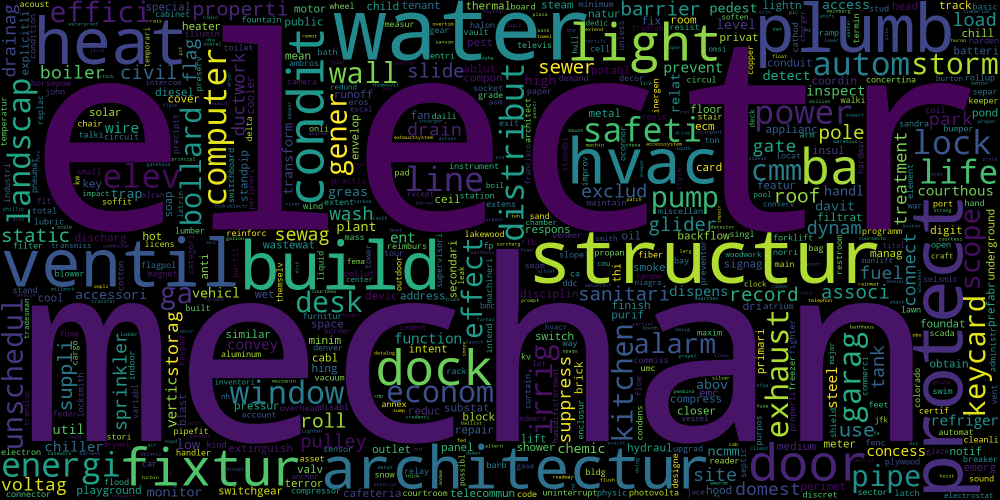

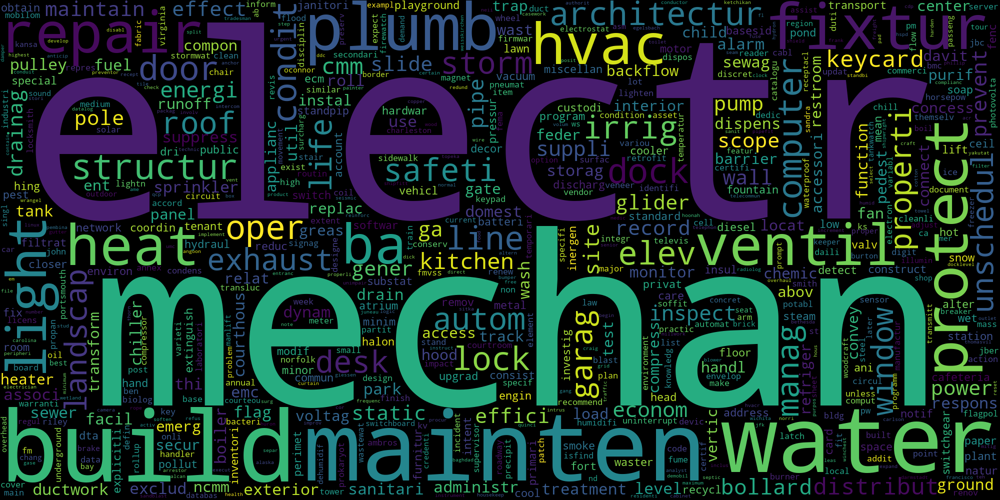

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
164643 -> STRENGTH: 100.0%
Customs Cargo Inspection Facility                                               
Electrical systems and equipment
Mechanical, plumbing, (where systems are connected to the GSA network, the Contractor’s employees will need to obtain a GSA ENT account, an HSPD-12 card and complete all GSA online university required courses to access systems) and heating, ventilation, exhaust systems and air conditioning (HVAC) systems and equipment
Fire protection and life safety systems and equipment
All Building Monitor and Controls system are within the scope of this contract

A minor revision is an incremental patch or update to the existing software or firmware version with low risk to existing interoperability
Architectural and structural systems, fixtures, and equipment within the site (to the property line)
Service request desk operations as identified in Secti

REQUIREMENTS                                                                    
The Contractor shall provide management, supervision, labor, materials, equipment, and supplies and is responsible for the efficient, effective, economical, and satisfactory operation,scheduled and unscheduled maintenance, and repair of equipment and systems located within the property line
Electrical systems and equipment
Mechanical, plumbing, (where systems are connected to the GSA network, the Contractor’s employees will need to obtain a GSA ENT account, an HSPD-12 card and complete all GSA online university required coursesto accesssystems) and heating, ventilation, exhaustsystems and air conditioning (HVAC)systems and equipment
Fire protection and life safety systems and equipment
All Building Monitor and Controls system are within the scope of this contract

A minor revision is an incremental patch or update to the existing software or firmware version with low risk to existing interoperability
Archi

In [7]:
topic_i = 13
top7(topic_i, W_normalized, corpus, doc_ids, tfidf, nmf)

#### Topic 31: General Construction, Repair, and Renovation
By looking at the output below, we can label this topic as "General Construction, Repair, and Renovation."  This topic is about general construction-heavy maintenance.  Recall that "HVAC" was the second most related to this topic with a value of 45.66%.

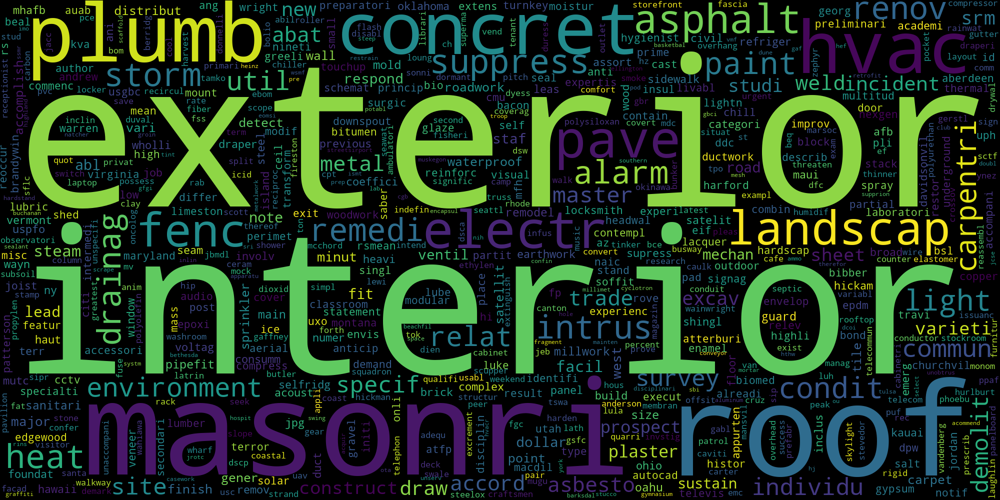

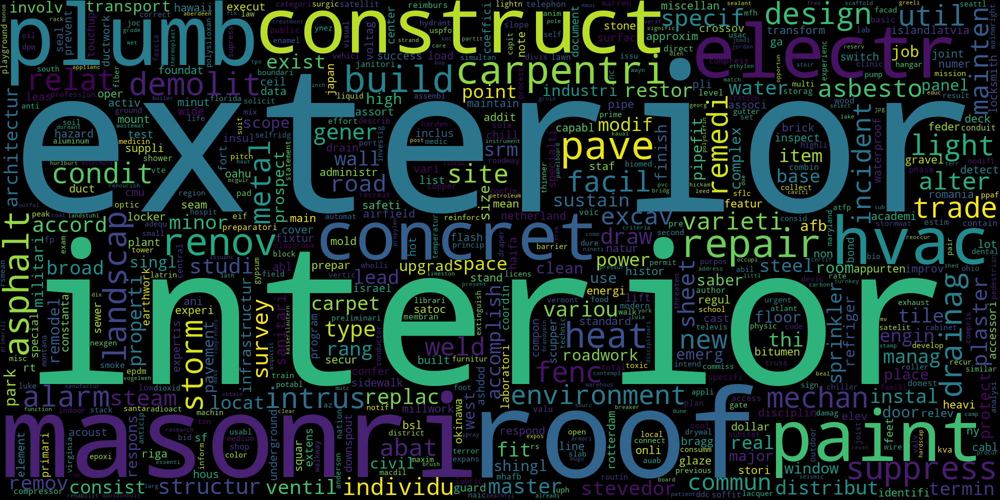

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
129454 -> STRENGTH: 100.0%
The Department of the Army, National Guard Bureau (NGB), may have a continuing requirement for construction services in the state of Mississippi

PREVIOUS REQUIREMENTS:
Typical work includes, but is not limited to:
Interior and exterior renovations
Heating and air-conditioning
HVAC controls
Plumbing
Fire suppression
Interior and exterior electrical and lighting
Fire and intrusion alarms
Communications
Limited utilities
Site-work
Landscaping
Fencing
Masonry,
Roofing
Concrete
Asphalt paving
Storm drainage
Limited environmental remediation
Construction of new facilities
Surveys
Studies
Design-build
Other related work

*************************************************************
153959 -> STRENGTH: 92.25%
The Department of Veterans Affairs, Office of Acquisition & Logistics, National Acquisition Center has a requirement for Indefinite Delivery Indefinit

In [8]:
topic_i = 31
top7(topic_i, W_normalized, corpus, doc_ids, tfidf, nmf)

#### Topic 2:  General Building Maintenance
By looking at the output below, we can label this topic as "General Building Maintenance."  "HVAC" came up as related to this topic, but to a much lesser degree than topics 13 and 31.  This means that HVAC is relevant to this topic, but it is not highly specific to "General Building Maintenance."  This topic is more about lighter handyman type maintenance.  Recall that "HVAC" was the the least related to this topic with a value of 4.94%.

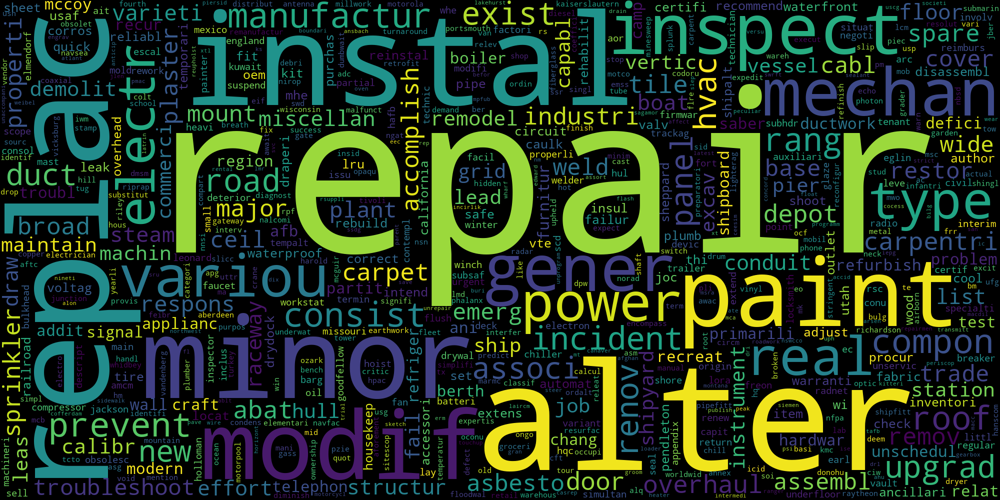

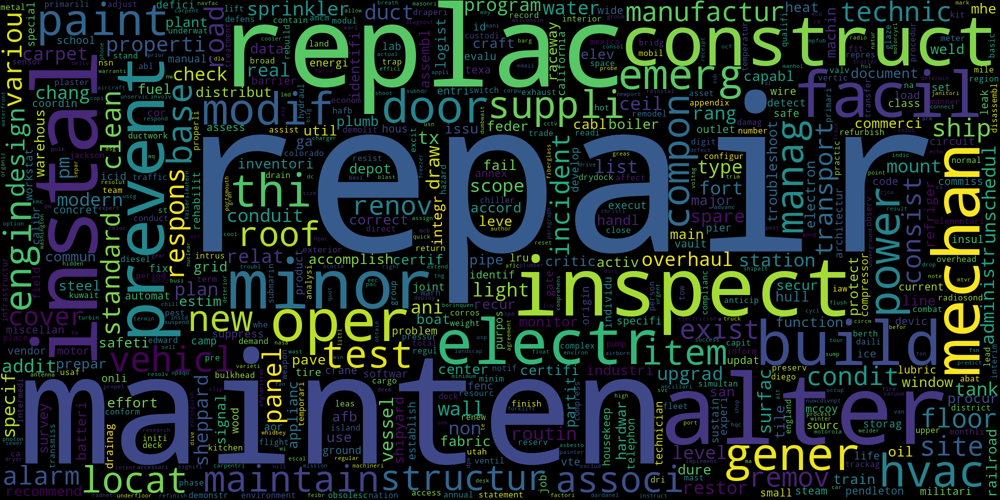

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
167135 -> STRENGTH: 100.0%
The Department of the Army, Installation Management Command, may have a continuing requirement for maintenance and repair of real property and minor construction at Fort Gordon, Georgia

REQUIREMENTS
Consists of maintenance, repair, and alteration projects

*************************************************************
165459 -> STRENGTH: 94.66%
The General Services Administration, on behalf of the Department of the Air Force, Air Force Medical Service, Air Force Medical Support Agency has a continuing requirement for Medical Treatment Facility operations & maintenance

REQUIREMENTS
These facilities and systems require ongoing scheduled preventative maintenance, unscheduled service and repair, as well as minor construction (repair and alteration) work.

*************************************************************
130147 -> STRENGTH: 88.14%
PREVIOUS R

In [9]:
topic_i = 2
top7(topic_i, W_normalized, corpus, doc_ids, tfidf, nmf)

## Find other documents in Building Mechanical Systems Maintenance (#13)
Now that we know the relevant topics, let's pick the most relevant topic, Building Mechanical Systems Maintenance, and find all the other documents within this topic.

#### Pick a threshold to only chose the most relevant documents
As we covered before, any one topic will most likely be related to multiple topics on varying levels.  Some documents that happen to contain a couple of the other minorly relevant keywords for topic 13, but the document will not actually be about Building Mechanical Systems Maintenance.  We can eliminate these undesired documents from the list by specifying a relevancy threshold.

To help choose a threshold, we can look at the distribution of all the relevancy values.

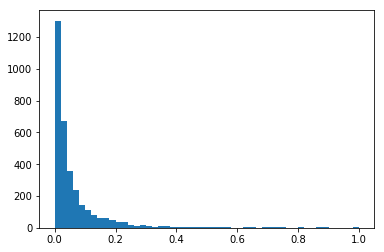

In [10]:
topic13 = W[:, 13]
topic13_normalized = topic13 / topic13.max(axis=0)
_ = plt.hist(topic13_normalized[topic13_normalized > 0.0], bins=50)

We usually want to choose the "elbow" of the graph, so in this case we will set the threshold to 0.08.  If we find that relevent documents are being excluded or irrelevent documents are being included, we can adjust the threshold up or down.

In [11]:
threshold = .08

topic13_i = topic13_normalized > threshold
topic13_tfidf = tfidf_corpus[topic13_i]
# topic13_corpus = corpus[topic13_i]
# topic13_doc_ids = doc_ids[topic13_i]

print(topic13_tfidf.shape[0], "documents relating to Building Mechanical Systems Maintenance.")

734 documents relating to Building Mechanical Systems Maintenance.


# Breaking down a broad topic into sub-topics
When creating latent topics from across the entire database, we may find that some of the "general topics" or first-level topics are too broad.

### Computer Science (Topic #5)
The *Computer Science* topic seems to encompass a range of projects in specialized areas.  We can further group this broad topic into more specific sets of sub-topics.

Let's take a look at of what we're working with:

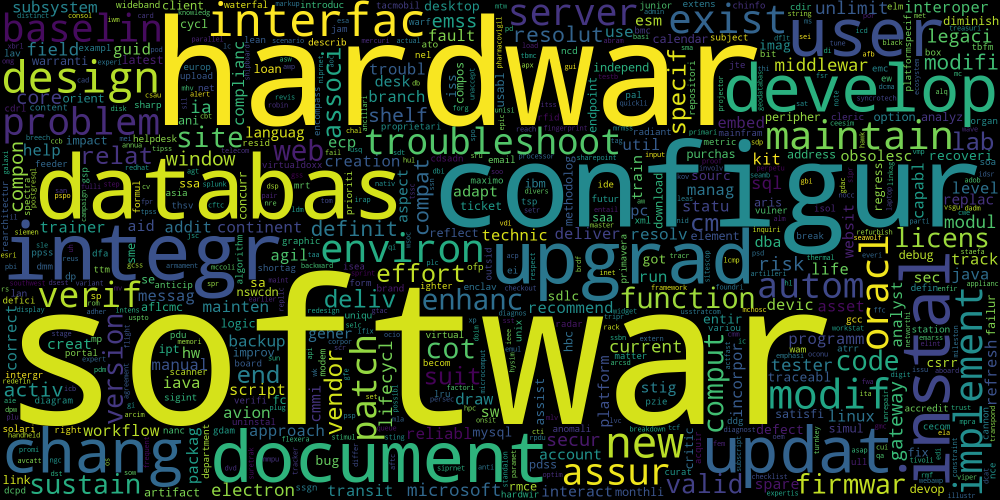

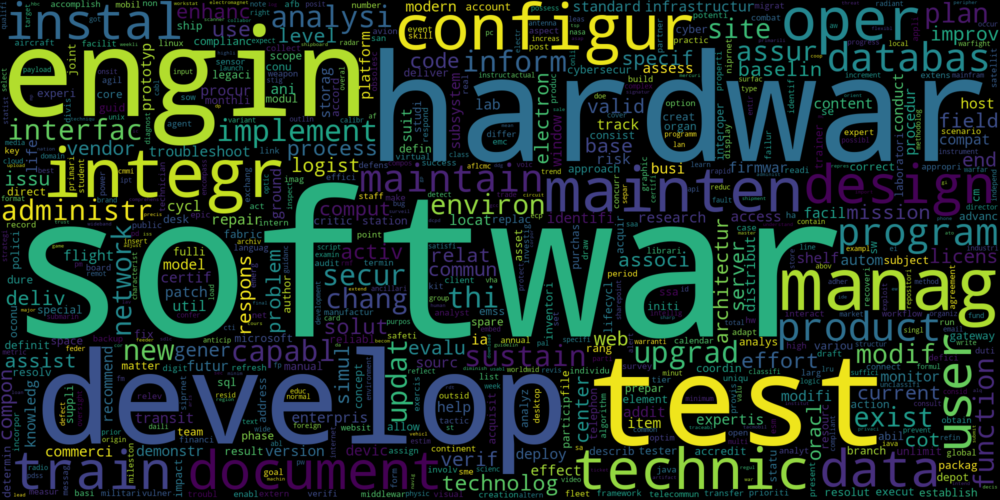

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
138913 -> STRENGTH: 100.0%
The Department of Defense (DoD), Defense Logistics Agency (DLA), has a requirement for Managed Print Services Fleet Assessment Software

REQUIREMENTS:
The contractor shall:
Provide documentation on the hardware requirements to run the MPS software, in addition to, server space, network bandwidth, and other network resources or network software required to support the software
Provide an installation and configuration guide describing the mitigation or compliance of security standards
Provide annual software maintenance and technical support
Provide updates and patches to keep software compliant with future IA requirements
Diagnose and resolve problems that arise with the software
Provide training and materials
Provide on-site assistance to install and configure the software

*************************************************************
152576 -> STRE

In [12]:
topic_i = 5
top7(topic_i, W_normalized, corpus, doc_ids, tfidf, nmf)

These documents all clearly outline contracts revolving around hardware, software, and computer technology in a broad sense.  We can also see that these documents cover a wide range of specialized fields within computer science.  Let's break this general topic down into more specific sub-topics:

#### Pick a threshold and find the relevant documents

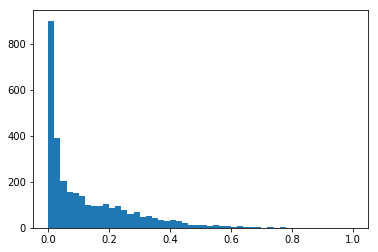

In [13]:
topic5 = W[:, 5]
topic5_normalized = topic5 / topic5.max(axis=0)
_ = plt.hist(topic5_normalized[topic5_normalized > 0.0], bins=50)

In [21]:
threshold = .1

topic5_i = topic5_normalized > threshold
topic5_tfidf = tfidf_corpus[topic5_i]
topic5_corpus = corpus[topic5_i]
topic5_doc_ids = doc_ids[topic5_i]

print(topic5_tfidf.shape[0], "documents relating to Computer Science.")

1319 documents relating to Computer Science.


#### Create a new topic model with 10 latent topics from the Computer Science corpus

In [22]:
n_topics = 10
topic5_nmf = NMF(n_components=n_topics, max_iter=666, random_state=666)

topic5_W = topic5_nmf.fit_transform(topic5_tfidf)
topic5_W_normalized = topic5_W / topic5_W.max(axis=0)
topic5_H = topic5_nmf.components_
topic5_H_normalized = topic5_H / topic5_H.max(axis=1).reshape((-1, 1))

print(topic5_nmf.n_iter_, "iterations")

267 iterations


#### Explore the newly created latent topics

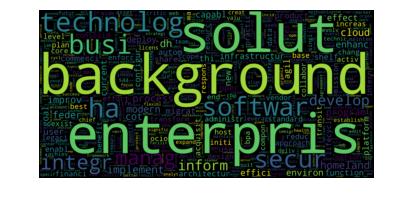

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
113047 -> STRENGTH: 100.0%
The Department of Homeland Security (DHS), Office of the Chief Information Officer (OCIO), Enterprise Service Delivery Office (ESDO) has a requirement for Architecture, Development, and Platform Technical Services (ADaPTS)

BACKGROUND
The Department of Homeland Security (DHS), Office of the Chief Information Officer (OCIO), is responsible for leading the engineering of DHS’ Digital Transformation by providing knowledgeable and innovative insights into technology products or services across all IT portfolios, strengthening cybersecurity, IT acquisition, IT security, executive oversight, and promoting the use and deployment of best of breed technologies using a unified framework for collectively managing IT investments

The scope of the services required includes, but is not limited to:
Program and project management
Engagement and facilitation of key 

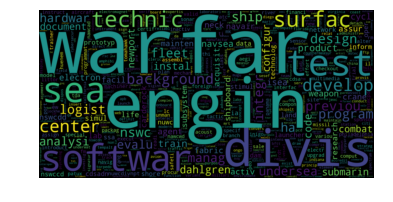

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
155072 -> STRENGTH: 100.0%
The Department of the Navy, Naval Sea Systems Command, Naval Surface Warfare Center

Dahlgren Division, has a requirement for Engineering and Technical Support Services

REQUIREMENTS
The Contractor shall provide:
General Program Management and Administrative Services
Engineering Program and Project Management
Mission Systems Engineering, Concepts, and Capabilities
REQUIREMENTS Management
Interface Management
Command, Control, Communications, Computers, and Intelligence (C4I)
Security Engineering
Communications and Network Systems Engineering
Hardware Systems Engineering
In-Service Systems and Fleet Support
Systems Engineering for Test and Evaluation Activities
Systems Engineering for Software Development Activities
Software Engineering Analysis
Software Design and Development
System Test Analysis
System Testing
Hardware Testing
Configuration Manageme

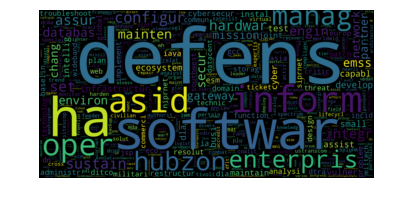

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
166446 -> STRENGTH: 100.0%
The Department of Defense (DoD), Defense Information Systems Agency (DISA), has a requirement for Special Services Line of Business- HUBZone Set Aside

REQUIREMENTS
The Contractor shall:
provide a wide-range of IT support functions needed to operate and maintain DoD business applications supporting DISA customers

Functions include:
customer support, software change management, information assurance, as well as system and database administration, in addition to network and communications support, plus backup and disaster recovery, and project management as it pertains to integrating customer applications into DISA data centers.

*************************************************************
154252 -> STRENGTH: 97.57%
The Department of Defense, Defense Information Systems Agency has a requirement for engineering expertise in the areas of Information As

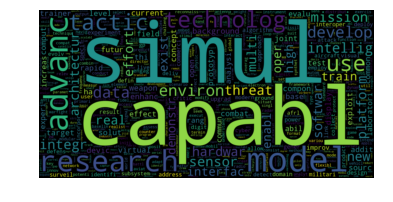

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
102144 -> STRENGTH: 100.0%
The effort includes the application of end-to-end directed energy (DE) modeling and simulation (M&S) software, applying simulations for increasing knowledge of processes to improve component performance and applying existing simulations to increase the knowledge of high power electromagnetic materials

The work with the Government’s Galaxy software suite and underlying DE simulations will advance the state-of-the-art and scientific knowledge in Directed Energy technology, and increase knowledge of the physical processes affecting the high-fidelity simulation of HPEM devices which are applied in selected environments

Call #8: High Power Electromagnetics Numerical Simulation Enhancement and Development
The work to be performed under the SOO is a Research and Development (R&D) effort to maintain and enhance existing high power electromagnetic modeling 

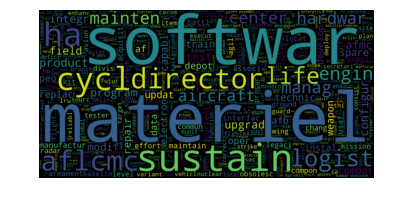

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
114713 -> STRENGTH: 100.0%
The Department of the Air Force, Air Force Materiel Command (AFMC), Air Force Life Cycle Center (AFLCMC), C2ISR Directorate, COCOM C2 Division has a continuing requirement for Global Strike and Product Support (GSPS) Software

REQUIREMENTS
The contractor shall perform full suite of engineering, software sustainment and/or development services to provide all tasks required the GSPS 2 software for AFLCMC-HBC

Tasks may include, but are not limited to: systems engineering, software maintenance/development, system integration and test, delivery, integrated logistics and training, configuration management, cyber security, data/documentation management, quality assurance, program management and specialized customer service.

*************************************************************
141481 -> STRENGTH: 82.61%
The Department of the Air Force, Air Force M

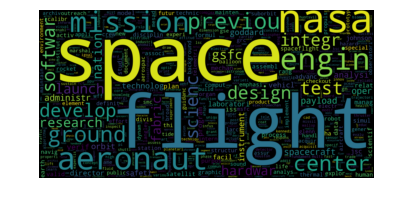

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
141959 -> STRENGTH: 100.0%
The National Aeronautics and Space Administration (NASA), Goddard Space Flight Center (GSFC), may have a continuing requirement for Systems Engineering and Advanced Services (SEAS)

PREVIOUS REQUIREMENTS
Systems Engineering and Advanced Services
The purpose of the SEAS contract is to acquire engineering and related services to Mission Engineering and Systems Analysis Division (MESAD) and related organizations, as required, for the formulation, design, development, fabrication, integration, testing, verification, and operations of space flight and ground system hardware and software, including development and validation of new technologies to enable future space and science missions
The emphasis is on engineering services and will be in the areas of mission systems engineering and instrument systems engineering

***************************************

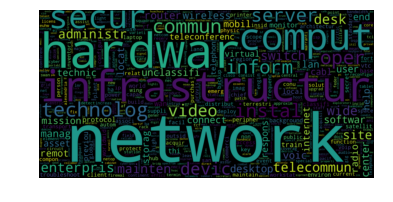

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
4739 -> STRENGTH: 100.0%
The Scientific and Technical network environment includes these components:     
Secret Wide Area Network (SWAN), which provides local secure (Secret) network connectivity
Unclassified Local Area Network (LAN)/Wide Area Network (WAN) computing
A telephone infrastructure
Video Teleconferencing (VTC) engineering
Worldwide scheduling
Bridging between 50-100 sites and operations
Information Security (InfoSec) processes and procedures
Official reporting of Information Assurance (IA) events
World Wide Web (WWW) based software application development and maintenance for Netscape, Unix, IIS, and Domino
24/7 Network Operations Center
User Help Desk

Technical and engineering support services are provided for operation and maintenance of the following:
S&T network infrastructure (physical and logical)
Infrastructure servers and services
Servers for processing of

OCAR is currently using technologies in the areas of high-speed networking, client/server applications, global information dissemination, and application programming

OCAR also relies on the Internet for information dissemination and remote collaboration activities

REQUIREMENTS:
The Contractor shall provide all personnel, equipment, supplies, facilities, transportation, tools, materials, supervision, and other items and non-personal services necessary to perform Information Technology Support Services including standard Microsoft and Linux network operating environment, telecommunication, storage area network (SAN), personal data access (PDA), communication equipment, databases, software, servers, router, switches and desktops
Day-to-day contractor support services for Local Area Network (LAN), Wide Area Network (WAN), Telecommunications, Network Security, and Logistics Support services

*************************************************************
118962 -> STRENGTH: 79.38%
These ser

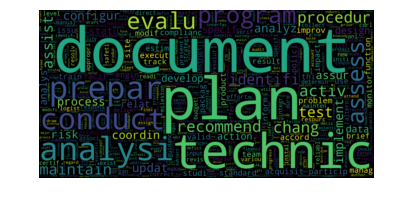

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
109825 -> STRENGTH: 100.0%
Review recommended changes from the fleet and other activities, Engineering Change Proposals (ECP), Site Activation Schedules, Weapon Systems Planning Documents, Navy Training Plans, Production Training and Support Equipment schedules and independent technical investigations

Identify variances from the documented plan and recommend corrective actions and track implementation to meet site/unit activation planning milestones

(d) Analyze and assess program planning and documentation to assure the acquisition planning includes all Depot Level Maintenance requirements (organic/commercial)

*************************************************************
132883 -> STRENGTH: 93.67%
Develop, prepare, and update input to acquisition documents/briefings to ensure financial data is accurate and consistent with approved budget plans and key program events

Analyz

As directed by the Contracting Officer’s Representative (COR) and the Program Managers (PM), the Contractor shall:
Analyze current technical contract management business processes and document potential improvements
Coordinate recommendations and requirements, and prioritize with appropriate stakeholders
Assist the Government with administration and configuration control of the readiness program contracts portfolio
Support analysis and resolution of contracting issues associated with integration of readiness systems
Support the Government development of readiness contracts metrics and policy
Maintain and update program acquisition information databases for Readiness contracts to ensure information is current, accurate and complete
Track contractor travel expenditures and conduct financial analysis to support readiness contract objectives
Provide readiness contract modification cost estimate development support to ensure required contract change estimates provided to the Government are 

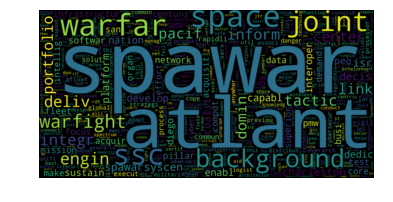

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
75665 -> STRENGTH: 100.0%
SUMMARY:                                                                        
Various Contractors are currently fulfilling the Space and Naval Warfare Systems Command's (SPAWAR), Charleston, requirement to develop a Pillar contracting strategy centered around the business portfolios supported by the command for Decision Superiority

BACKGROUND:
SPAWAR Systems Center Atlantic (SSC Atlantic) is a Department of the Navy organization with a mission to rapidly deliver and support solutions that enable information dominance for our Naval, Joint, National and Coalition Warfighters

SSC Atlantic meets our nation's demands for uninterrupted vigilance, fail-safe cybersecurity, adaptive response and engineering excellence by delivering secure, integrated and innovative solutions to many naval, joint and national agencies

*************************************

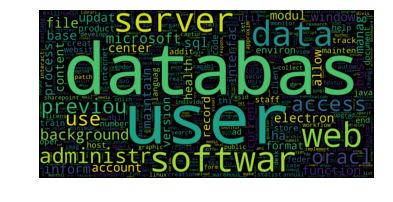

TOP 7 MOST RELEVANT DOCUMENTS (auto-summarized)

*************************************************************
142190 -> STRENGTH: 100.0%
Users can access information residing in the database based on their individual access permissions via DISANet

The web server and database server reside on a central system that processes information requests on-the-fly and provides responses based on the user privileges

PREVIOUS REQUIREMENTS:
The Contractor shall provide the following services:
Enhancements and New Modules
Enhancing and modernizing a scalable, networked, web interface SQL based database system
Gathering REQUIREMENTS and developing/enhancing new modules
Planning, Program, Budget and Execution (PPBE), Acquisition & Contract Management business process research, formulation, and definitions
Integration with other DoD and/or DISA systems/applications
Sustainment a Maintenance
Adherence to Security Technical Implementation Guidelines (STIG)
Certification & Accreditation (C&A) documenta

The system shall provide customizable role-based access for administrators, users, call recording access, call recoding administration

The system shall provide access to reports on servers via web interface as an option to view reports for internal personnel only

Both end-user and system administrator training shall be available

************************************************************
************************************************************


In [24]:
for topic_i in range(n_topics):
    wc = WordCloud(background_color="black", max_words=666, width=2000, height=1000)
    wc.fit_words({vocabulary[word_i]: topic5_H[topic_i, word_i] for word_i in range(topic5_H.shape[1]) if topic5_H[topic_i, word_i]})
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    top7(topic_i, topic5_W_normalized, topic5_corpus, topic5_doc_ids, tfidf, topic5_nmf, False, 3)
    print("************************************************************\n************************************************************")

### We now have a new topic model (with H and W matrices) that we can use to employ every technique covered in this report!
We can use the exact same techniques already covered and every technique that follows to search for documents and/or topics with this new model.

# Finding other documents related to a specific document
Another use for NMF is the ability use a known desirable document to search for other documents that are highly similar to it.

Here we will use a random document to find other documents that are related to it.  Using this technique, we can identify documents that have similar strengths to the original in each of the 42 topics.  This way we can find other topics that relate to the same unique combination of topics as the one we already know is desirable.  This is in contrast to searching based on relevancy to only a single topic, as demonstrated above.

#### Examine the document we know to be desirable

In [17]:
doc_i = 500

doc = corpus[doc_i]
doc_topics = W_normalized[doc_i]
print("Relevant topics:")
[print(str(i).rjust(2), " = ", round(x * 100, 2), "%", sep="") for i, x in sorted(enumerate(doc_topics), key=lambda item: item[1], reverse=True) if x]
print("\nFULL TEXT:")
print(doc)

Relevant topics:
16 = 31.13%
14 = 24.47%
18 = 22.99%
 3 = 21.36%
38 = 17.8%
19 = 7.12%
35 = 5.91%
40 = 4.04%
21 = 3.8%
32 = 2.81%
27 = 2.29%
28 = 1.83%
39 = 1.68%
20 = 0.56%
26 = 0.34%
 5 = 0.23%

FULL TEXT:
The Department of Army, Army Installation Management Command (IMCOM, may have a continuing requirement for scientific, engineering and technical expertise in support of the Environmental and Natural Resources Division (ENRD) and Engineering Plans and Services Division (EPSD) missions of the Directorate of Public Works at Fort Huachuca, Arizona.
PREVIOUS REQUIREMENTS:
Scientific, engineering and technical expertise in support of the Environmental and Natural Resources Division (ENRD) and Engineering Plans and Services Division EPSD) missions of the Directorate of Public Works at Fort Huachuca, Arizona
Tasks will generally fall within the areas of:
Analyses, studies, evaluation, and/or remediation of the effects of Fort Huachuca activities
Preparation of designs, reports, plans, and 

### That's a lot of topics!
This document calls for "engineering and techical expertise in support of the Environmental and Natural Resources Division."  So maybe a MissionMark customer has expressed interest in this specific document, and would like to see other engineering contracts relating to environmental projects.

First let's look at the wordclouds of the topics that are most relevant to this document (16, 14, 18, 3, and 38).

Topic 16


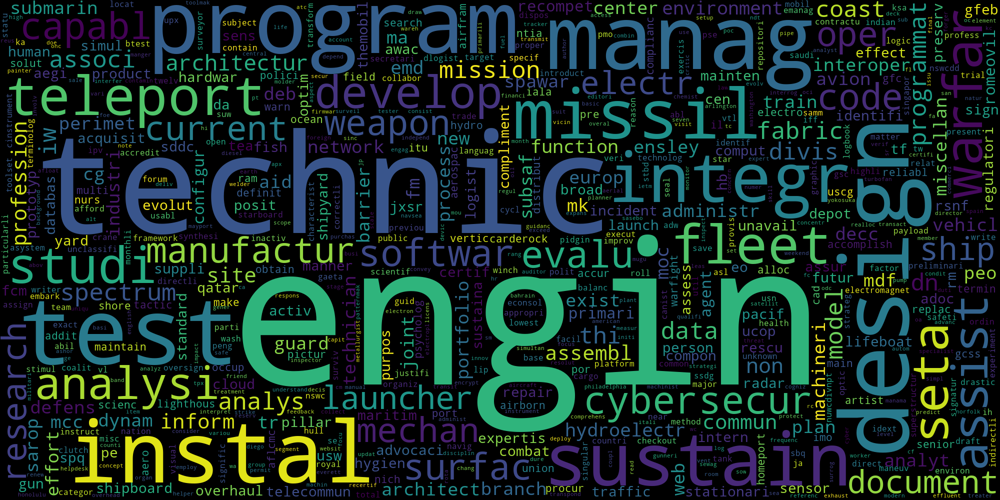


Topic 14


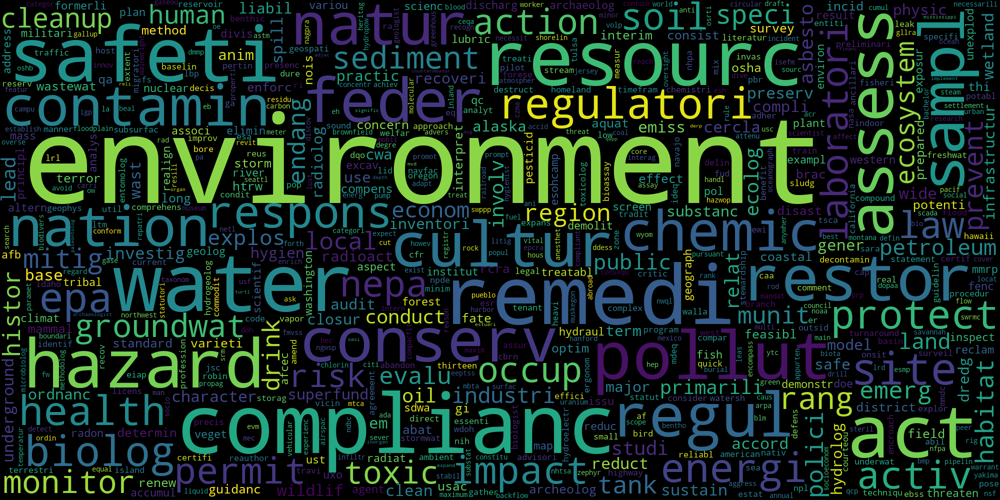


Topic 18


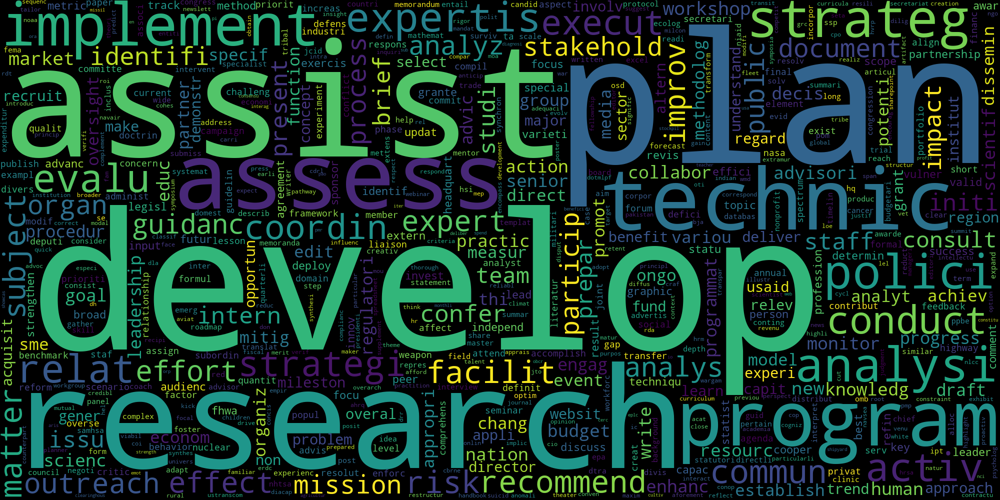


Topic 3


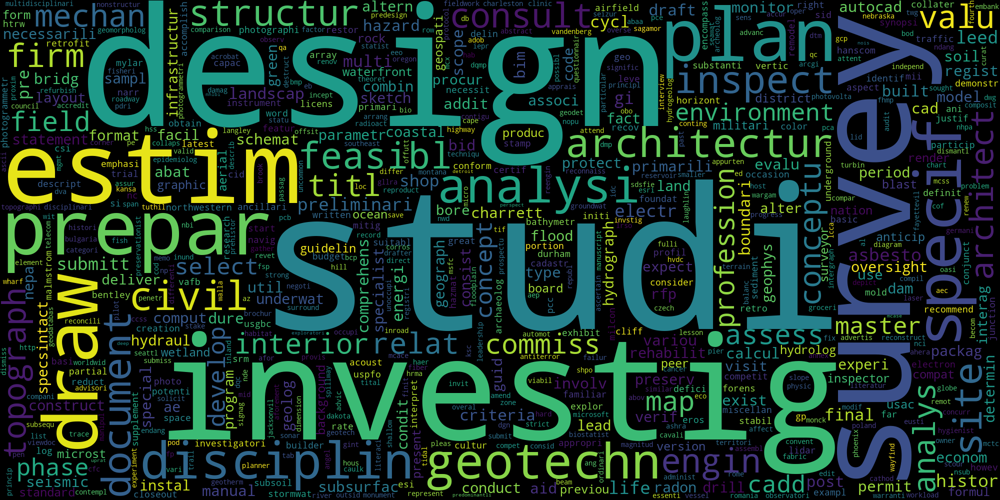


Topic 38


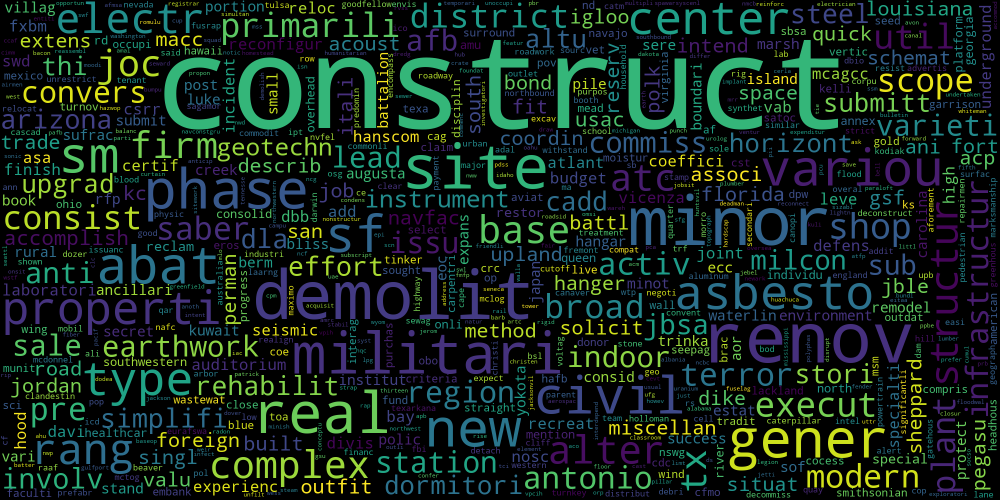

In [18]:
good_topics = [16, 14, 18, 3, 38]
for topic_i in good_topics:
    print("Topic", topic_i)
    display(Image(filename=f"../static/wordclouds/{topic_i}_{'tfidf' if topic_i == 16 else 'nmf'}_wordcloud.png"))
    print()

#### Find top 5 documents relevant to this one

In [19]:
from scipy.spatial.distance import cosine
distances = [cosine(W[doc_i], W[i]) for i in range(W.shape[0])]
best_matches = np.argsort(distances)[1:6]

for i in best_matches:
    print("*************************************")
    print(corpus[i])
    print()

*************************************
The Department of the Army, US Army Corps of Engineers (USACE), Baltimore District, has a continuing requirement for Architect-Engineer Services for various value engineering requirements to support USACE and its customers primarily located within the assigned mission areas of the North Atlantic Division (NAD) and other USACE Regions.
REQUIREMENTS
The work may encompass a wide range of value methodology or other decision making tools to: perform value-based program/project planning charrettes; performing value-based project design charrettes; leading value based review of requests for proposals and/or plans & specifications; preparing risk determinations and mitigation plans for specific programs/projects; leading lessons learned reviews and after action reviews including participation from project managers, HQUSACE, and project delivery teams to assist with documentation of such reviews; performing traditional Value Engineering workshops for desig

In [20]:
#wc.to_image().show()